In [3]:
import os
import h5py

import torch
import torchvision
from torchvision.transforms import v2

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
# Just to make the session somewhat determinate
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
set_seed(0)

In [5]:
print(f"CUDA is available: {torch.cuda.is_available()}")

if not torch.cuda.is_available():
    print("If you want, you might want to switch to a GPU-accelerated session!")
    device = torch.device('cpu')
else:
    device = torch.device('cuda')

CUDA is available: False
If you want, you might want to switch to a GPU-accelerated session!


In [6]:
data_file = "D:\MSc Astrophysics\Advanced deep learning\Challenge\Galaxy10_DECals.h5"

In [7]:
class Features_Dataset(torch.utils.data.Dataset):
    def __init__(self, archive):
        self.archive = archive
        self._load()

    def _load(self):
        with h5py.File(self.archive, 'r', libver='latest', swmr=True) as archive:
            # Directly transpose to BCHW from BHWC for PyTorch
            self.images = np.transpose(np.array(archive['images']), [0, 3, 1, 2])
            self.labels = np.array(archive['ans'])
            remove_labels = range(5)
            for label in remove_labels:
                idx = self.labels != label
                self.labels = self.labels[idx]
                self.images = self.images[idx]
            self.labels -=5
        del(self.archive)

    def __getitem__(self, index):
        return self.images[index], self.labels[index]

    def __len__(self):
        return len(self.labels)

In [8]:
train_split = 0.8
valid_split = 0.1

full_dataset = Features_Dataset(archive=data_file)

test_split = 1 - train_split - valid_split

train_dataset, valid_dataset, test_dataset = torch.utils.data.random_split(
        full_dataset, [train_split, valid_split, test_split]
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=128, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=128, shuffle=False)

In [9]:
fig_size = 4

def show_images(images, labels=None, num_columns=5, num_rows=3):
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(fig_size * num_columns, fig_size * num_rows),
                        subplot_kw={'xticks': [], 'yticks': []})

    labels = [None] * num_columns * num_rows if labels is None else labels

    for ax, image, label in zip(axs.flat, images, labels):
        # Use a grayscale colourmap if we have only a single channel
        cmap = 'gray' if image.shape[0] == 1 else None

        # Imshow expects HWC, so backtransform here again
        ax.imshow(np.transpose(image, [1, 2, 0]), cmap=cmap)
        if label:
            ax.set_title(f"{label}")

    plt.tight_layout()
    plt.show()

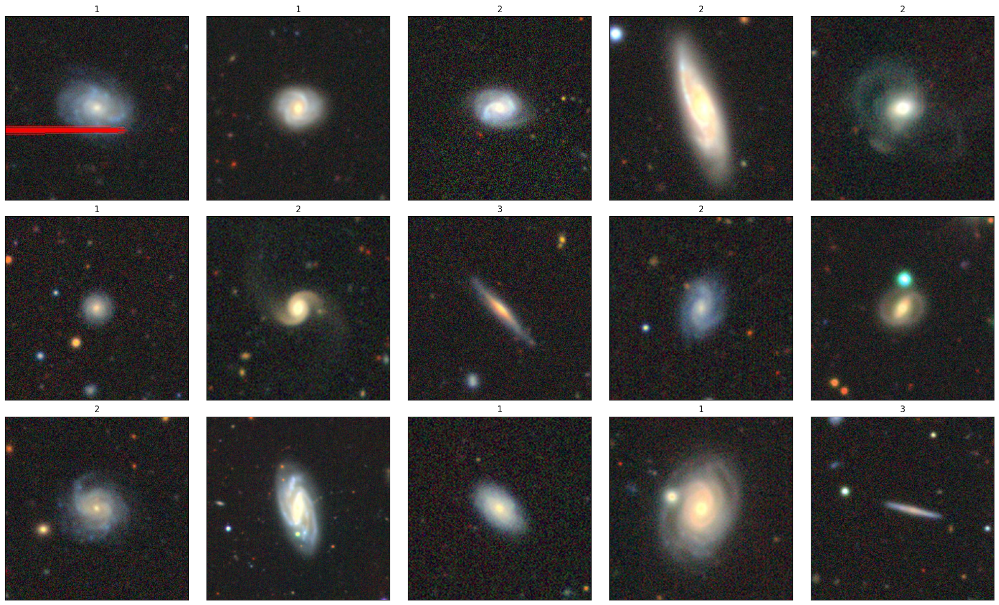

In [158]:
images, labels = next(iter(train_loader))

show_images(images, labels)

In [159]:
GALAXY_LABEL_DICT = {
    # of galaxies we are dealing with here
    0: "Barred Sprial",
    1: "Unbarred Tight Spiral",
    2: "Unbarred Loose Spiral",
    3: "Edge-on without Bulge",
    4: "Edge-on with Bulge",
}

def get_label_text(labels):
    return [GALAXY_LABEL_DICT[label.item()] for label in labels]

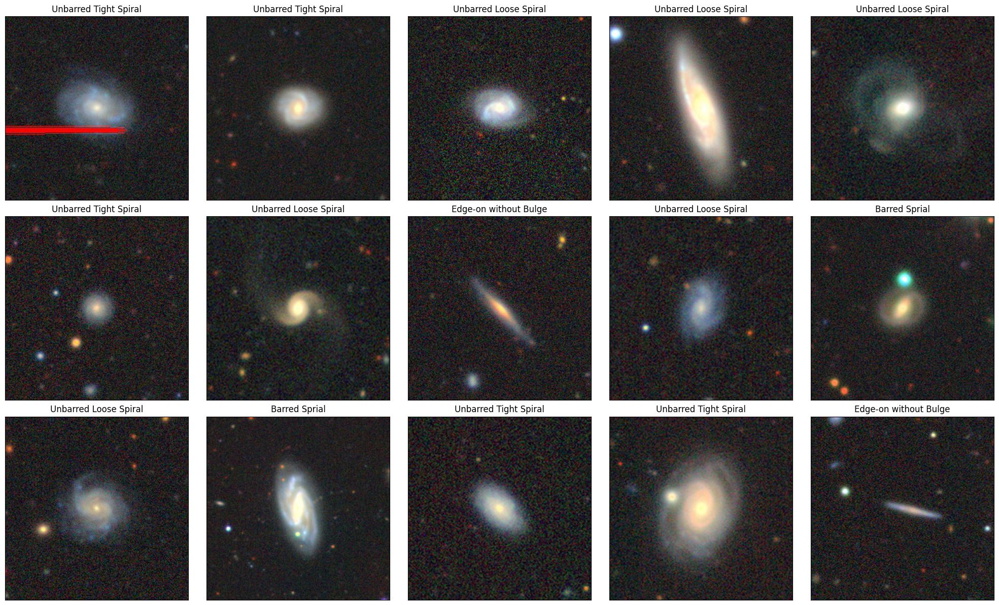

In [160]:
show_images(images, get_label_text(labels))

In [161]:
resize_transform = v2.Compose([
    v2.ToDtype(torch.float32, scale=True),
    v2.CenterCrop(size=(64, 64))
])

resize_transform2 = v2.Compose([
    v2.ToDtype(torch.float32, scale=True),
    v2.Resize(64)
])

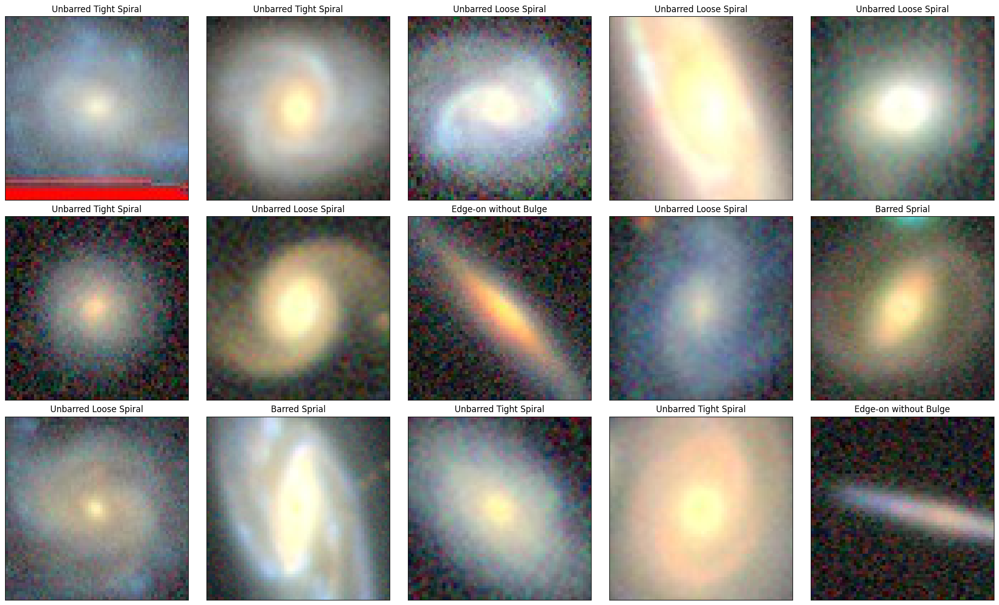

In [164]:
show_images(resize_transform(images), get_label_text(labels))

In [17]:
import fastprogress


def train(dataloader, optimizer, model, loss_fn, device, master_bar,
          transform_common=None, transform_input=None):
    """Run one training epoch.

    Args:
        dataloader (DataLoader): Torch DataLoader object to load data
        optimizer: Torch optimizer object
        model (nn.Module): Torch model to train
        loss_fn: Torch loss function
        device (torch.device): Torch device to use for training
        master_bar (fastprogress.master_bar): Will be iterated over for each
            epoch to draw batches and display training progress
        transform_common (function): Transform to apply to input and target
        transform_input (function): Transform to apply to the input for de-noising.
            By default, no transform is carried out

    Returns:
        float: Mean loss of this epoch
    """
    epoch_loss = []

    for x, _ in fastprogress.progress_bar(dataloader, parent=master_bar):
        optimizer.zero_grad()
        model.train()

        x = transform_common(x) if transform_common else x
        x_inp = transform_input(x) if transform_input else x

        # Forward pass
        x = x.to(device)
        x_inp = x_inp.to(device)
        x_hat, mu, logvar = model(x_inp)

        # Compute loss
        loss = loss_fn(x_hat, x, mu, logvar)

        # Backward pass
        loss.backward()
        optimizer.step()

        # For plotting the train loss, save it for each sample
        epoch_loss.append(loss.item())
        master_bar.child.comment = f"Train Loss: {epoch_loss[-1]:.3f}"

    # Return the mean loss and the accuracy of this epoch
    return np.mean(epoch_loss)


def validate(dataloader, model, loss_fn, device, master_bar,
             transform_common=None, transform_input=None):
    """Compute loss on validation set.

    Args:
        dataloader (DataLoader): Torch DataLoader object to load data
        model (nn.Module): Torch model to train
        loss_fn: Torch loss function
        device (torch.device): Torch device to use for training
        master_bar (fastprogress.master_bar): Will be iterated over to draw
            batches and show validation progress
        transform_common (function): Transform to apply to input and target
        transform_input (function): Transform to apply to the input for de-noising.
            By default, no transform is carried out

    Returns:
        float: Mean loss on validation set
    """
    epoch_loss = []

    model.eval()
    with torch.no_grad():
        for x, _ in fastprogress.progress_bar(dataloader, parent=master_bar):
            x = transform_common(x) if transform_common else x

            x_inp = transform_input(x) if transform_input else x

            # make a prediction on test set
            x = x.to(device)
            x_inp = x_inp.to(device)
            x_hat, mu, logvar = model(x_inp)

            # Compute loss
            loss = loss_fn(x_hat, x, mu, logvar)

            # For plotting the train loss, save it for each sample
            epoch_loss.append(loss.item())
            master_bar.child.comment = f"Valid. Loss: {epoch_loss[-1]:.3f}"

    # Return the mean loss, the accuracy and the confusion matrix
    return np.mean(epoch_loss)




def train_model(model, optimizer, loss_function, device, num_epochs,
                train_dataloader, valid_dataloader,
                transform_common=None, transform_input=None):
    """Run model training.

    Args:
        model (nn.Module): Torch model to train
        optimizer: Torch optimizer object
        loss_fn: Torch loss function for training
        device (torch.device): Torch device to use for training
        num_epochs (int): Max. number of epochs to train
        train_dataloader (DataLoader): Torch DataLoader object to load the
            training data
        valid_dataloader (DataLoader): Torch DataLoader object to load the
            test data
        transform_common (function): Transform to apply to input and target
        transform_input (function): Transform to apply to the input for de-noising.
            By default, no transform is carried out

    Returns:
        list, list: Return list of train losses, test losses.
    """
    master_bar = fastprogress.master_bar(range(num_epochs))
    epoch_list, train_losses, valid_losses = [], [], []

    master_bar.names = ["Train", "Valid."]

    for epoch in master_bar:
        # Train the model
        epoch_train_loss = train(train_dataloader, optimizer, model, loss_function, device, master_bar, transform_common, transform_input)
        # Validate the model
        epoch_valid_loss = validate(valid_dataloader, model, loss_function, device, master_bar, transform_common, transform_input)

        # Save loss and acc for plotting
        epoch_list.append(epoch + 1)
        train_losses.append(epoch_train_loss)
        valid_losses.append(epoch_valid_loss)

        graphs = [[epoch_list, train_losses], [epoch_list, valid_losses]]
        x_bounds = [1, num_epochs]

        master_bar.write(
            f"Epoch {epoch + 1}, "
            f"avg. train loss: {epoch_train_loss:.3f}, "
            f"avg. valid. loss: {epoch_valid_loss:.3f}"
        )
        master_bar.update_graph(graphs, x_bounds)


    return train_losses, valid_losses

In [18]:
from torch import nn

class Autoencoder(nn.Module):

    def __init__(self, image_size=64, num_channels=3, latent_dims=128, num_filters=64, do_sampling=False):
        super(Autoencoder, self).__init__()

        self.latent_dims  = latent_dims
        self.image_size   = image_size
        self.num_channels = num_channels
        self.num_filters  = num_filters
        self.do_sampling  = do_sampling

        # Encoder
        self.conv_encoder = nn.Sequential(
            # TODO: Build the convolutional layers (torch.nn.Conv2d) here
            nn.Conv2d(self.num_channels, self.num_filters, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(self.num_filters, self.num_filters * 2, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(self.num_filters * 2, self.num_filters * 4, kernel_size=4, stride=2, padding=1),
            nn.ReLU()
        )

        # Linear Encoder
        # TODO: Match the dimensionality of the first and last layer here!
        # self.fc_lin_down = nn.Linear(<MATCH_DIM>, 8 * self.num_filters)
        self.fc_lin_down = nn.Linear(self.num_filters * 4 * 8 * 8, 8 * self.num_filters)
        self.fc_mu       = nn.Linear(8 * self.num_filters, self.latent_dims)
        self.fc_logvar   = nn.Linear(8 * self.num_filters, self.latent_dims)
        self.fc_z        = nn.Linear(self.latent_dims, 8 * self.num_filters)
        # self.fc_lin_up   = nn.Linear(8 * self.num_filters, <MATCH_DIM>)
        self.fc_lin_up = nn.Linear(8 * self.num_filters, self.num_filters * 4 * 8 * 8)

        # Decoder
        self.conv_decoder = nn.Sequential(
            # TODO: Implement the reverse of the encoder here using torch.nn.ConvTranspose2d layers
            # The last activation here should be a sigmoid to keep the pixel values clipped in [0, 1)
            nn.ConvTranspose2d(self.num_filters * 4, self.num_filters * 2, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(self.num_filters * 2, self.num_filters, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(self.num_filters, self.num_channels, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def encode(self, x):
        ''' Encoder: output is (mean, log(variance))'''
        x       = self.conv_encoder(x)
        # Here, we resize the convolutional output appropriately for a linear layer
        # TODO: Fill in the correct dimensionality for the reordering
        # x       = x.view(-1, self.num_filters * 8 * 8)
        x       = x.view(-1, self.num_filters * 4 * 8 * 8)
        x       = self.fc_lin_down(x)
        x       = nn.functional.relu(x)
        mu      = self.fc_mu(x)
        logvar  = self.fc_logvar(x)
        return mu, logvar

    def sample(self, mu, logvar):
        ''' Sample from Gaussian with mean `mu` and SD `sqrt(exp(logvarz))`'''
        # Only use the full mean/stddev procedure if we want to later do sampling
        # And only reparametrise if we are in training mode
        if self.training and self.do_sampling:
            std = torch.exp(logvar * 0.5)
            eps = torch.randn_like(std)
            sample = mu + (eps * std)
            return sample
        else:
            return mu

    def decode(self, z):
        '''Decoder: produces reconstruction from sample of latent z'''
        z = self.fc_z(z)
        z = nn.functional.relu(z)
        z = self.fc_lin_up(z)
        z = nn.functional.relu(z)
        # TODO: Fill in the correct dimensionality for the reordering here again
        # z = z.view(-1, self.num_filters, 8, 8)
        z = z.view(-1, self.num_filters * 4, 8, 8)
        z = self.conv_decoder(z)
        return z

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.sample(mu, logvar)
        x_hat = self.decode(z)
        if self.do_sampling:
            return x_hat, mu, logvar
        else:
            return x_hat, None, None

In [19]:
def autoencoder_loss(recon_x, x, mu=None, logvar=None):
    mse_loss = torch.nn.functional.mse_loss(recon_x, x, reduction='sum') / x.size(dim=0)

    if mu is not None and logvar is not None:
        raise NotImplementedError("Looks like you still need to implement the KL divergence loss!")
    else:
        return mse_loss

In [20]:
model = Autoencoder()
model = model.to(device)
learning_rate = 2e-4
optimizer = torch.optim.Adam(model.parameters(), learning_rate)

In [21]:
# Let's display our model here
model

Autoencoder(
  (conv_encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): ReLU()
  )
  (fc_lin_down): Linear(in_features=16384, out_features=512, bias=True)
  (fc_mu): Linear(in_features=512, out_features=128, bias=True)
  (fc_logvar): Linear(in_features=512, out_features=128, bias=True)
  (fc_z): Linear(in_features=128, out_features=512, bias=True)
  (fc_lin_up): Linear(in_features=512, out_features=16384, bias=True)
  (conv_decoder): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): Sigmoid()
  )
)

In [22]:
# Some training parameters - feel free to modify them as you like!
learning_rate = 2e-4
num_epochs = 15
noise_level = 5e-2

def transform_noise(x):
    noise = noise_level * torch.randn_like(x)
    return torch.clamp(x + noise, 0.0, 1.0)

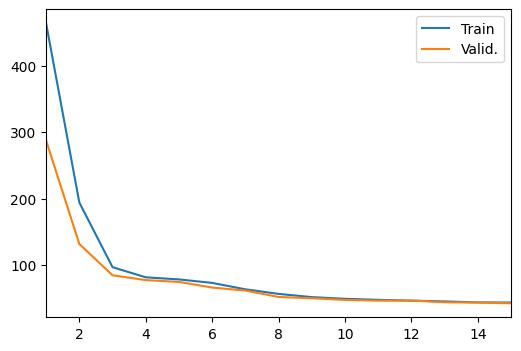

([464.2555079306326,
  194.03926123342205,
  96.4484475658786,
  81.15256438716766,
  77.97712830574282,
  72.7403736114502,
  63.07430691872874,
  56.164750806746945,
  51.29950363405289,
  48.72516465956165,
  47.20658677624118,
  45.992329259072584,
  44.79758939435405,
  43.322619715044574,
  43.13828591377504],
 [287.7057762145996,
  131.39872646331787,
  84.2359619140625,
  76.96702003479004,
  74.22248077392578,
  65.73123836517334,
  61.19807767868042,
  51.52520179748535,
  49.57262420654297,
  47.11093854904175,
  45.91258192062378,
  46.108773708343506,
  43.464457988739014,
  43.035258293151855,
  42.00556468963623])

In [23]:
train_model(model, optimizer, autoencoder_loss, device, num_epochs, train_loader, valid_loader, resize_transform)

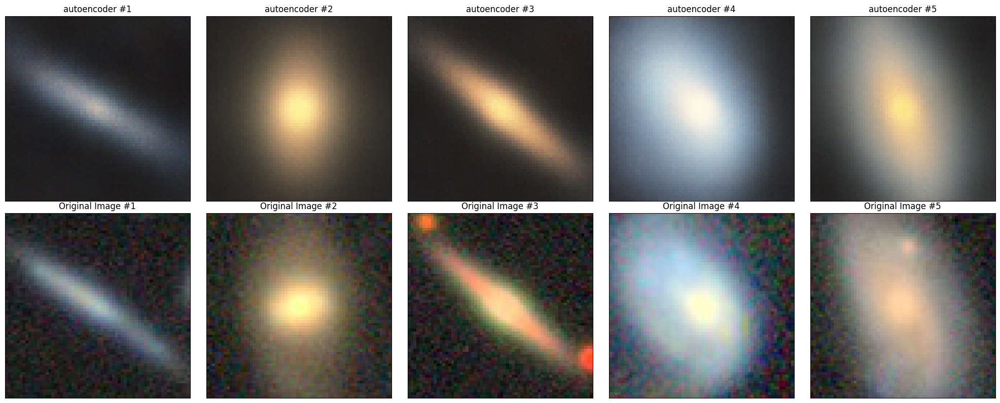

In [24]:
test_images = resize_transform(next(iter(test_loader))[0][:5])

model.eval()
with torch.no_grad():
    denoised_test_images, _, _ = model(test_images.to(device))

denoised_test_images = denoised_test_images.to('cpu')

labels = [f"autoencoder #{i}" for i in range(1, 6)]\
       + [f"Original Image #{i}" for i in range(1, 6)]
images = torch.cat([denoised_test_images, test_images])

show_images(images, labels, num_rows=2, num_columns=5)

In [25]:
model.do_sampling = True
imgs, mu, _ = model(images)

In [26]:
images.shape, imgs.shape, mu.shape

(torch.Size([10, 3, 64, 64]),
 torch.Size([10, 3, 64, 64]),
 torch.Size([10, 128]))

In [27]:
resize_transform(full_dataset.images).shape

(9796, 3, 256, 256)

In [28]:
fulldata = images

In [29]:
imgs, mu, _ = model(fulldata)

In [30]:
mu.shape

torch.Size([10, 128])

In [31]:
type(images)

torch.Tensor

In [32]:
milky_way_path = r"C:\Users\Subarna\Downloads\milky_way.jpg"

In [33]:
milky_way = torchvision.io.read_image(milky_way_path).unsqueeze(0)

In [34]:
milky_way.shape

torch.Size([1, 3, 390, 392])

In [35]:
resize_transform(milky_way).shape

torch.Size([1, 3, 64, 64])

In [165]:
img, milky_way_encoding, _ = model(resize_transform2(milky_way))

In [166]:
milky_way.shape

torch.Size([1, 3, 390, 392])

In [167]:
from torch.nn.functional import cosine_similarity


In [168]:
similarities = [cosine_similarity(milky_way_encoding.view(-1), encoding.view(-1), dim=0) for encoding in mu]

# Print the similarities
for i, sim in enumerate(similarities):
    print(f"Cosine similarity from milky_way_encoding to image {i}: {sim.item()}")

Cosine similarity from milky_way_encoding to image 0: 0.3611553907394409


In [169]:
imgs_euc_dist = []
imgs_cos_sim = []
with torch.no_grad():
    for i, v in train_loader:
        _, encoding, _ = model(resize_transform(i))
        cos_sim = [cosine_similarity(milky_way_encoding.view(-1), e.view(-1), dim=0) for e in encoding]
        euc_dis = [torch.dist(milky_way_encoding.view(-1), e.view(-1), p=2) for e in encoding]
        imgs_cos_sim.extend([x.item() for x in cos_sim])
        imgs_euc_dist.extend([x.item() for x in euc_dis])

In [170]:
cos_srt = np.argsort(imgs_cos_sim)

In [171]:
euc_dis_srt = np.argsort(imgs_euc_dist)

In [172]:
np.argmax(imgs_cos_sim)

784

In [173]:
euc_dis_srt

array([6876, 2589, 6048, ..., 2772, 6433, 3848], dtype=int64)

In [174]:
cos_srt

array([4652, 2471, 6595, ...,  182, 6731,  784], dtype=int64)

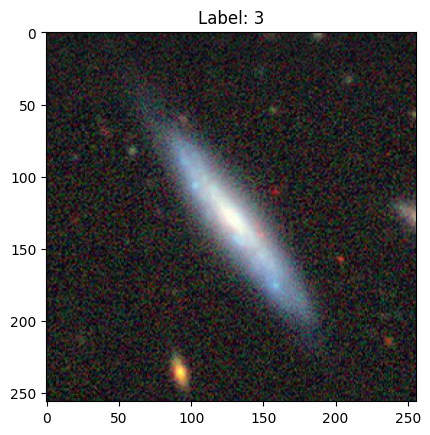

In [223]:
index = 6875  # replace with your index
image, label = full_dataset[index]  # get image and label

# Convert tensor to numpy array and move color channel to the end
image = image.transpose((1, 2, 0))

# Plot image
plt.imshow(image, cmap='gray' if image.shape[2] == 1 else None)
plt.title(f"Label: {label}")
plt.show()
# plt.savefig('galaxy_euc3_.jpg')

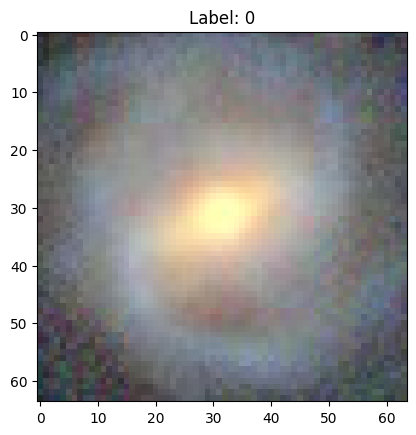

<Figure size 640x480 with 0 Axes>

In [220]:
from torchvision.transforms import CenterCrop
from PIL import Image

index = 181  # replace with your index
image, label = full_dataset[index]  # get image and label

# Convert tensor to numpy array and move color channel to the end
image = image.transpose((1, 2, 0))

# Convert numpy array to PIL Image
image_pil = Image.fromarray(image)

# Apply center crop
crop_transform = CenterCrop((64, 64))
image_cropped = crop_transform(image_pil)

# Convert PIL Image back to numpy array
image_cropped = np.array(image_cropped)

# Plot image
plt.imshow(image_cropped, cmap='gray' if image_cropped.shape[2] == 1 else None)
plt.title(f"Label: {label}")
plt.show()
plt.savefig('galaxy2_eu_cropped.jpg')

In [ ]:
images.shape

torch.Size([128, 3, 256, 256])

In [ ]:
images.shape

torch.Size([128, 3, 256, 256])

In [89]:
train_loader.dataset[6643]

(array([[[55, 48, 31, ..., 58, 53, 27],
         [52, 41, 35, ..., 78, 75, 47],
         [20, 28, 38, ..., 92, 71, 37],
         ...,
         [29, 27,  9, ..., 38, 43, 42],
         [38, 35, 19, ..., 24, 42, 49],
         [37, 41, 44, ...,  3, 28, 42]],
 
        [[24, 42, 54, ..., 36, 34, 34],
         [56, 42, 25, ..., 28, 41, 50],
         [62, 42, 14, ..., 25, 33, 38],
         ...,
         [26, 45, 54, ..., 33, 34, 27],
         [36, 46, 47, ..., 44, 48, 38],
         [36, 42, 51, ..., 41, 45, 32]],
 
        [[ 3, 30, 46, ..., 49, 53, 44],
         [39, 28, 23, ..., 53, 65, 57],
         [48, 27, 14, ..., 60, 56, 40],
         ...,
         [33, 55, 60, ..., 40, 53, 58],
         [23, 32, 33, ..., 45, 48, 34],
         [ 8, 11, 18, ..., 30, 29,  7]]], dtype=uint8),
 2)

In [81]:
torch.Tensor(train_loader.dataset[6643][1]).unsqueeze(0)

tensor([[0.5166, 0.0000]])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


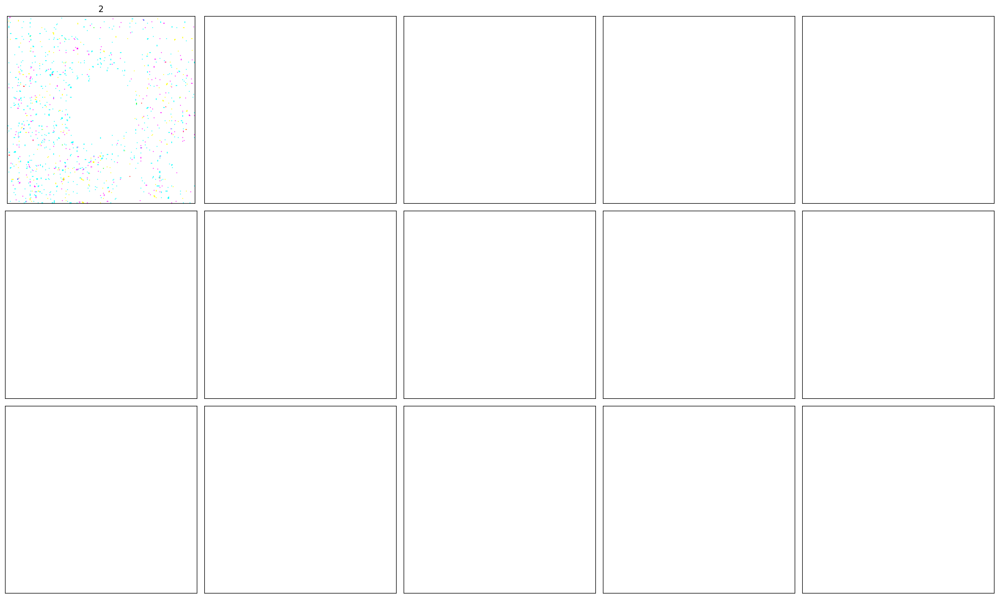

In [87]:
show_images(torch.Tensor(train_loader.dataset[6643][0]).unsqueeze(0), torch.tensor([train_loader.dataset[6643][1]]))

In [102]:
'''sample = torchvision.io.read_image("milkyway.jpg")
sample = resize_transform(sample)
sample = sample.unsqueeze(0)
sample.shape
'''
sample = torch.randn((512,128))

In [239]:
def gen_sample(mu, logvar):
    std = torch.exp(logvar * 0.35)
    eps = torch.randn_like(std)
    sample = mu + (eps * std)
    return sample

mu, logvar = model.encode(resize_transform2(milky_way))


In [240]:
def generate(model, samples):
    with torch.no_grad():
        gen_imgs = model.decode(samples.to(device))
    return gen_imgs

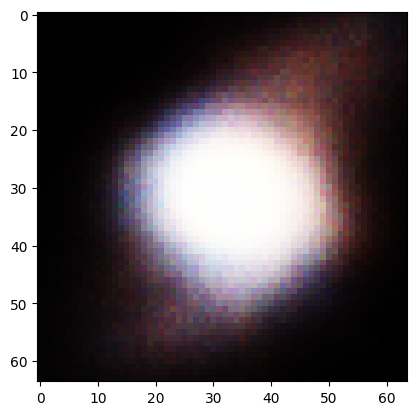

In [247]:
# imgs = generate(vae_model, vae_model.conv_decoder(sample))
sample = gen_sample(mu, logvar)
imgs = generate(model, sample)
im = np.transpose(imgs[0], [1,2,0])
plt.imshow(im)